### Requirements:
Choose the most suitable model based on its accuracy to check if a transaction is fraudulent.

Dataset source : https://www.kaggle.com/datasets/dermisfit/fraud-transactions-dataset?resource=download

In [1]:
#Import 2 datasets

import pandas as pd
train = pd.read_csv('fraudTrain.csv')
test = pd.read_csv('fraudTest.csv')


In [2]:
#Combine 2 datasets by concatenating

df = pd.concat([train,test])
df.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [3]:
#Checking missing values

print(df.isna().sum().sort_values())

Unnamed: 0               0
merch_lat                0
unix_time                0
trans_num                0
dob                      0
job                      0
city_pop                 0
long                     0
lat                      0
zip                      0
merch_long               0
state                    0
street                   0
gender                   0
last                     0
first                    0
amt                      0
category                 0
merchant                 0
cc_num                   0
trans_date_trans_time    0
city                     0
is_fraud                 0
dtype: int64


In [ ]:
=> There are no missing values

In [5]:
!pip install ydata-profiling

In [6]:
#Having an overview of the dataset

from ydata_profiling import ProfileReport
prof = ProfileReport(df)
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
#Khi dùng numeric_only = False để tính cho tất cả features trong df thì báo lỗi nên em chỉ tính được correlation cho numeric values

df_corr = df.corr(numeric_only = True)
df_corr

,Unnamed: 0,cc_num,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud
Unnamed: 0,1.000000,0.000063,0.000949,0.000370,0.000239,-0.000610,-0.000880,0.174527,0.000211,-0.000611,0.000524
cc_num,0.000063,1.000000,0.001826,0.041504,-0.058744,-0.048429,-0.009118,0.000284,-0.058415,-0.048421,-0.001125
amt,0.000949,0.001826,1.000000,0.001979,-0.000670,-0.000735,0.004921,-0.002411,-0.000613,-0.000711,0.209308
zip,0.000370,0.041504,0.001979,1.000000,-0.114554,-0.909795,0.077601,0.001017,-0.113934,-0.908981,-0.002190
lat,0.000239,-0.058744,-0.000670,-0.114554,1.000000,-0.014744,-0.154816,0.000741,0.993582,-0.014709,0.002904
long,-0.000610,-0.048429,-0.000735,-0.909795,-0.014744,1.000000,-0.052359,-0.000574,-0.014585,0.999118,0.001022
city_pop,-0.000880,-0.009118,0.004921,0.077601,-0.154816,-0.052359,1.000000,-0.001636,-0.153863,-0.052329,0.000325
unix_time,0.174527,0.000284,-0.002411,0.001017,0.000741,-0.000574,-0.001636,1.000000,0.000696,-0.000571,-0.013329
merch_lat,0.000211,-0.058415,-0.000613,-0.113934,0.993582,-0.014585,-0.153863,0.000696,1.000000,-0.014554,0.002778
merch_long,-0.000611,-0.048421,-0.000711,-0.908981,-0.014709,0.999118,-0.052329,-0.000571,-0.014554,1.000000,0.000999


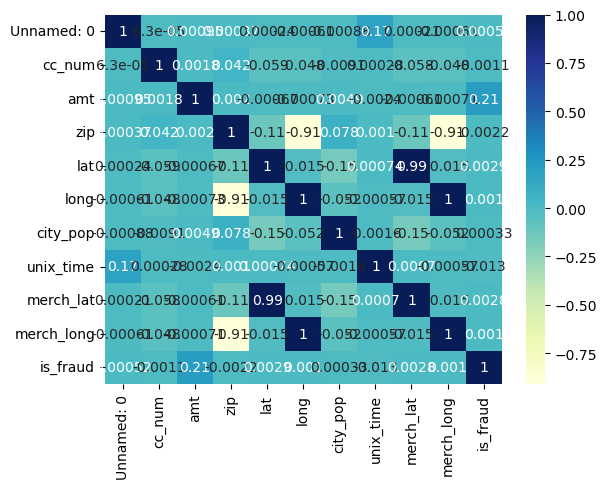

In [16]:
#Correlation heatmap

import seaborn as sns
import matplotlib.pyplot as plt
sns.heatmap(df_corr, cmap='YlGnBu' ,annot=True)
plt.show()


In [ ]:
Comments:
    - No missing values
    - Heatmap does not show any features having high correlation with target column
    - Proceed EDA for further investigation

In [8]:
#EDA

print(df.describe)
df.columns

<bound method NDFrame.describe of         Unnamed: 0 trans_date_trans_time            cc_num  \
0                0   2019-01-01 00:00:18  2703186189652095   
1                1   2019-01-01 00:00:44      630423337322   
2                2   2019-01-01 00:00:51    38859492057661   
3                3   2019-01-01 00:01:16  3534093764340240   
4                4   2019-01-01 00:03:06   375534208663984   
...            ...                   ...               ...   
555714      555714   2020-12-31 23:59:07    30560609640617   
555715      555715   2020-12-31 23:59:09  3556613125071656   
555716      555716   2020-12-31 23:59:15  6011724471098086   
555717      555717   2020-12-31 23:59:24     4079773899158   
555718      555718   2020-12-31 23:59:34  4170689372027579   

                                  merchant        category     amt      first  \
0               fraud_Rippin, Kub and Mann        misc_net    4.97   Jennifer   
1          fraud_Heller, Gutmann and Zieme     grocery_pos 

Index(['Unnamed: 0', 'trans_date_trans_time', 'cc_num', 'merchant', 'category',
       'amt', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip',
       'lat', 'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time',
       'merch_lat', 'merch_long', 'is_fraud'],
      dtype='object')

In [ ]:
We will eliminate these features:
    - High distinct value columns: cc_num, trans_date_trans_time, unix_time, city_pop, trans_num, merch_lat, merch_long
    - Text columns: merchant, first, last
    - Columns with location info, we will prioritize numeric type => Keep lat,long and exclude the rest
    => Select these columns based on hypothesis to proceed EDA: gender, age, job, category, transaction_time

In [5]:
'''GENDER'''
#No fraud transaction numbers based on gender

gender_no_fraud = df[df['is_fraud'] == 0].groupby('gender')[('trans_num')].count().reset_index()
gender_no_fraud.rename(columns = {'trans_num':'no_fraud'}, inplace = True)
print(gender_no_fraud)


  gender  no_fraud
0      F   1009850
1      M    832893


In [6]:
#Fraud transaction numbers based on gender

gender_fraud = df[df['is_fraud'] == 1].groupby('gender')[('trans_num')].count().reset_index()
gender_fraud.rename(columns = {'trans_num':'fraud'}, inplace = True)
print(gender_fraud)


  gender  fraud
0      F   4899
1      M   4752


In [7]:
total_gender_fraud = gender_fraud.merge(gender_no_fraud, on = 'gender', how='left')
total_gender_fraud['%fraud'] = gender_fraud['fraud']/(gender_fraud['fraud'] + gender_no_fraud['no_fraud'])
total_gender_fraud['%no_fraud'] = total_gender_fraud['no_fraud']/(total_gender_fraud['fraud'] + total_gender_fraud['no_fraud'])
print(total_gender_fraud)

  gender  fraud  no_fraud    %fraud  %no_fraud
0      F   4899   1009850  0.004828   0.995172
1      M   4752    832893  0.005673   0.994327


In [ ]:
From the total_gender_fraud dataframe, we can see that %fraud and %no_fraud of Male/Female are almost equal
=> We can conclude that gender has no relationship with target column

In [8]:
'''DOB'''
import datetime
today = (datetime.datetime.strptime('2023', '%Y'))
current_year = int(today.strftime('%Y'))

print(df['dob'].info)


<bound method Series.info of 0         1988-03-09
1         1978-06-21
2         1962-01-19
3         1967-01-12
4         1986-03-28
             ...    
555714    1966-02-13
555715    1999-12-27
555716    1981-11-29
555717    1965-12-15
555718    1993-05-10
Name: dob, Length: 1852394, dtype: object>


In [9]:
#Fraud rate by age


df['dob'] = pd.to_datetime(df['dob'])
df['year'] = df['dob'].dt.year
df['age'] = current_year - df['year']
age_fraud = df[df['is_fraud'] == 1].groupby('age')[('trans_num')].count().reset_index()
age_fraud.rename(columns = {'trans_num':'fraud'}, inplace = True)
print(age_fraud)

    age  fraud
0    18      7
1    19     32
2    20     21
3    21     12
4    22     58
..  ...    ...
77   95     41
78   96     54
79   97     33
80   98     11
81   99      7

[82 rows x 2 columns]


In [10]:
#No fraud rate by age

age_no_fraud = df[df['is_fraud'] == 0].groupby('age')[('trans_num')].count().reset_index()
age_no_fraud.rename(columns = {'trans_num':'no_fraud'}, inplace = True)
print(age_no_fraud)

    age  no_fraud
0    18      2915
1    19     10935
2    20      5812
3    22      8024
4    23     13840
..  ...       ...
75   94      8745
76   95      5811
77   96      6547
78   97      8750
79   99       728

[80 rows x 2 columns]


In [11]:
total_age_fraud = age_fraud.merge(age_no_fraud, on ='age', how ='left')
total_age_fraud['%fraud'] = total_age_fraud['fraud']/(total_age_fraud['fraud'] + total_age_fraud['no_fraud'])
total_age_fraud                        

,age,fraud,no_fraud,%fraud
0,18,7,2915.0,0.002396
1,19,32,10935.0,0.002918
2,20,21,5812.0,0.003600
3,21,12,NaN,NaN
4,22,58,8024.0,0.007176
...,...,...,...,...
77,95,41,5811.0,0.007006
78,96,54,6547.0,0.008181
79,97,33,8750.0,0.003757
80,98,11,NaN,NaN


In [174]:
total_age_fraud['%fraud'].describe()

count    80.000000
mean      0.006015
std       0.002362
min       0.002396
25%       0.004325
50%       0.005615
75%       0.007014
max       0.016189
Name: %fraud, dtype: float64

<Axes: >

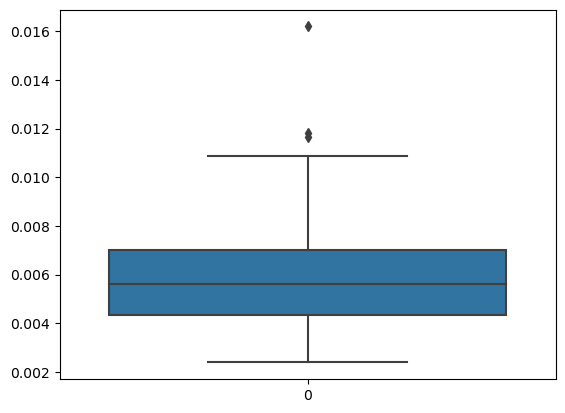

In [186]:
sns.boxplot(data=total_age_fraud['%fraud'])

In [ ]:
From total_age_fraud table, we can see that %fraud of each age does not differ greatly. 
Besides, too few outliers are detected, thus we do not have to examine more this feature. 
=> In conclusion, age will not be included in our model

In [12]:
'''JOB'''

job_fraud = df[df['is_fraud'] == 1].groupby('job')[('cc_num')].count().reset_index().sort_values(ascending=False, by='cc_num')
job_fraud.rename(columns = {'cc_num':'fraud'}, inplace = True)

job_no_fraud = df[df['is_fraud'] == 0].groupby('job')[('cc_num')].count().reset_index().sort_values(ascending=False, by='cc_num')
job_no_fraud.rename(columns = {'cc_num':'no_fraud'}, inplace = True)


In [13]:
total_job_fraud = job_fraud.merge(job_no_fraud, on = 'job', how = 'left')
total_job_fraud['%fraud'] = total_job_fraud['fraud']/(total_job_fraud['fraud'] + total_job_fraud['no_fraud'])
total_job_fraud

,job,fraud,no_fraud,%fraud
0,Quantity surveyor,69,8011.0,0.008540
1,Naval architect,66,12368.0,0.005308
2,Materials engineer,62,11649.0,0.005294
3,Audiological scientist,58,8743.0,0.006590
4,Senior tax professional/tax inspector,57,5820.0,0.009699
...,...,...,...,...
489,Professor Emeritus,4,730.0,0.005450
490,Interpreter,4,2182.0,0.001830
491,Statistician,3,3642.0,0.000823
492,Health physicist,3,4371.0,0.000686


In [14]:
total_job_fraud['%fraud'].describe()

count    472.000000
mean       0.006545
std        0.004564
min        0.000458
25%        0.003842
50%        0.005451
75%        0.007749
max        0.042105
Name: %fraud, dtype: float64

<Axes: >

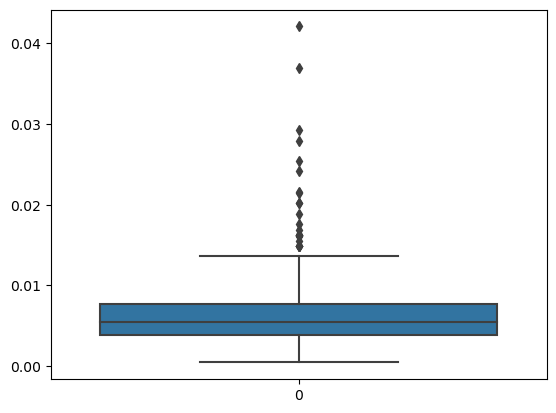

In [17]:
sns.boxplot(data=total_job_fraud['%fraud'])

In [18]:
import numpy as np
x = total_job_fraud['%fraud'].tolist()
y = np.nanpercentile(x,95)
y

0.014864864864864866

In [19]:
job_filter = total_job_fraud[total_job_fraud['%fraud'] > y]
job_filter

,job,fraud,no_fraud,%fraud
70,TEFL teacher,32,728.0,0.042105
101,Lawyer,28,729.0,0.036988
125,Medical technical officer,25,1456.0,0.016880
140,"Pharmacist, hospital",24,1459.0,0.016183
141,Jewellery designer,24,1455.0,0.016227
150,Economist,23,1454.0,0.015572
166,Community development worker,22,729.0,0.029294
184,"Accountant, chartered certified",21,730.0,0.027963
213,Horticultural consultant,19,727.0,0.025469
231,Clinical cytogeneticist,18,726.0,0.024194


In [ ]:
The percentage values of job is pretty simlilar due to the approximate equality of the mean and the median.
We will extract the outliers which means choosing the job values that have %fraud > p95 (95th percentile) and adding to model

In [20]:
df['job'] = df['job'].apply(lambda x: 'Other' if x not in job_filter['job'].tolist() else x)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'travel'),
  Text(1, 0, 'shopping_pos'),
  Text(2, 0, 'shopping_net'),
  Text(3, 0, 'personal_care'),
  Text(4, 0, 'misc_pos'),
  Text(5, 0, 'misc_net'),
  Text(6, 0, 'kids_pets'),
  Text(7, 0, 'home'),
  Text(8, 0, 'health_fitness'),
  Text(9, 0, 'grocery_pos'),
  Text(10, 0, 'grocery_net'),
  Text(11, 0, 'gas_transport'),
  Text(12, 0, 'food_dining'),
  Text(13, 0, 'entertainment')])

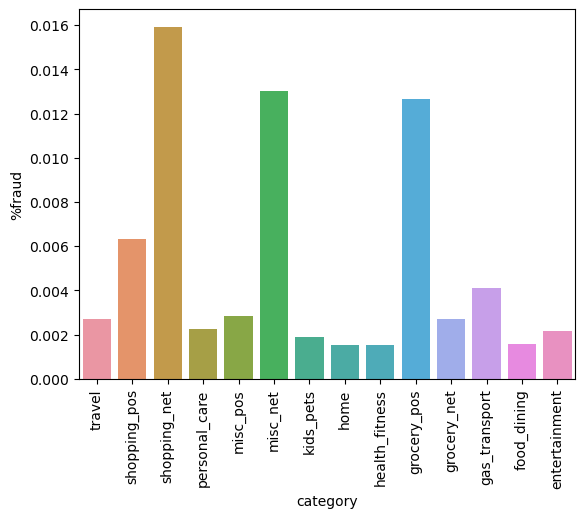

In [21]:
'''CATEGORY'''

cate_fraud = df[df['is_fraud'] == 1].groupby('category')[('trans_num')].count().reset_index().sort_values(ascending=False, by = 'category')
cate_fraud.rename(columns = {'trans_num':'fraud'}, inplace = True)


cate_no_fraud = df[df['is_fraud'] == 0].groupby('category')[('trans_num')].count().reset_index().sort_values(ascending=False, by = 'category')
cate_no_fraud.rename(columns = {'trans_num':'no_fraud'}, inplace = True)

total_cate_fraud = cate_fraud.merge(cate_no_fraud, on = 'category', how = 'left')
total_cate_fraud['%fraud'] = total_cate_fraud['fraud']/(total_cate_fraud['fraud'] + total_cate_fraud['no_fraud'])
sns.barplot(total_cate_fraud, x = 'category', y = '%fraud')
plt.xticks(rotation=90)

In [286]:
We can see that some values of category like shopping_pos, shopping_net, misc_net, groceru_pos have way more higher 
%fraud than others. Thus, this feature may have relationship with target column => we put it in our model

In [22]:
'''TRANSACTION TIME'''

df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'], format='%Y-%m-%d %H:%M:%S')
df['trans_hour'] = df['trans_date_trans_time'].dt.hour

trans_hour_fraud = df[df['is_fraud'] == 1].groupby('trans_hour')[('trans_num')].count().reset_index() 
trans_hour_fraud.rename(columns = {'trans_num':'fraud'}, inplace = True)

trans_hour_no_fraud = df[df['is_fraud'] == 0].groupby('trans_hour')[('trans_num')].count().reset_index() 
trans_hour_no_fraud.rename(columns = {'trans_num':'no_fraud'}, inplace = True)

<Axes: xlabel='trans_hour', ylabel='%fraud'>

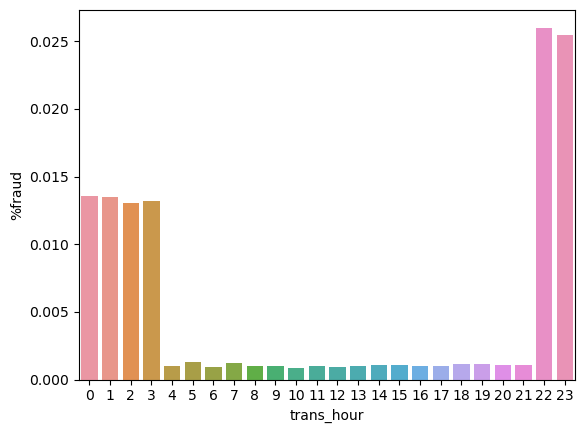

In [23]:
total_trans_hour_fraud = trans_hour_fraud.merge(trans_hour_no_fraud, on = 'trans_hour', how = 'left')
total_trans_hour_fraud['%fraud'] = total_trans_hour_fraud['fraud']/(total_trans_hour_fraud['fraud'] + total_trans_hour_fraud['no_fraud'])
sns.barplot(total_trans_hour_fraud, x = 'trans_hour', y = '%fraud')

In [162]:
The graph shows the ratio of fraud by trans_hour, it appears that on 22 PM and 23 PM, users tend to have more fraud.
There is a steady decline in fraud between 0 AM and 3 AM, fraud is substantially low from 3AM onwards
=> We can use this feature for our model

SyntaxError: invalid decimal literal (2547635417.py, line 2)

In [351]:
#BRIEF SUMMARY
After performing EDA, we have these features for the model

1. cc_num: primary key
2. job: keep the job with %fraud values > 95% percentile
3. category: Category of merchants
4. trans_hour: Transaction hour 
5. amt: Amount of money
5. lat, long: Location of users
6. merch_lat, merch_long: Location of merchants



0           4.97
1         107.23
2         220.11
3          45.00
4          41.96
           ...  
555714     43.77
555715    111.84
555716     86.88
555717      7.99
555718     38.13
Name: amt, Length: 1852394, dtype: float64

In [24]:
df = df[['cc_num', 'job', 'category', 'trans_hour', 'amt', 'lat', 'long', 'merch_lat', 'merch_long','is_fraud']]
df

,cc_num,job,category,trans_hour,amt,lat,long,merch_lat,merch_long,is_fraud
0,2703186189652095,Other,misc_net,0,4.97,36.0788,-81.1781,36.011293,-82.048315,0
1,630423337322,Other,grocery_pos,0,107.23,48.8878,-118.2105,49.159047,-118.186462,0
2,38859492057661,Nature conservation officer,entertainment,0,220.11,42.1808,-112.2620,43.150704,-112.154481,0
3,3534093764340240,Other,gas_transport,0,45.00,46.2306,-112.1138,47.034331,-112.561071,0
4,375534208663984,Other,misc_pos,0,41.96,38.4207,-79.4629,38.674999,-78.632459,0
...,...,...,...,...,...,...,...,...,...,...
555714,30560609640617,Other,health_fitness,23,43.77,40.4931,-91.8912,39.946837,-91.333331,0
555715,3556613125071656,Other,kids_pets,23,111.84,29.0393,-95.4401,29.661049,-96.186633,0
555716,6011724471098086,Other,kids_pets,23,86.88,46.1966,-118.9017,46.658340,-119.715054,0
555717,4079773899158,Other,travel,23,7.99,44.6255,-116.4493,44.470525,-117.080888,0


In [ ]:
**HANDLING CATEGORY VALUES**

In [25]:

def onehot_encoded(data, list_columns): 
    
    from sklearn.preprocessing import OneHotEncoder
    
    one_hot_data = pd.get_dummies(data, columns = list_columns)
    
    print('DONE')
    
    return one_hot_data
 
data_onehot = onehot_encoded(df, ['job','category'])


DONE


In [ ]:
**Normalization**

In [26]:
normalization_columns = data_onehot.columns.tolist()


In [27]:

def normalize(data, list_columns):
    
    from sklearn.preprocessing import MinMaxScaler
    
    
    #Filter the data that contains list columns need to normalize:
    filter_df = data[list_columns]
    
    #Scale Feature: 
    scaler = MinMaxScaler()
    model=scaler.fit(filter_df)
    scaled_data=model.transform(filter_df)
    
    #Scaled data to dataframe: 
    scaled_data = pd.DataFrame(scaled_data, columns = list_columns)
    
    #Drop column in original data and merge with scaled data: 
    data.drop(columns = list_columns, inplace = True)
    # data = data.join(scaled_data)
    print('DONE')
    
    return data.join(scaled_data)
   
new_data = normalize(data_onehot, normalization_columns)

DONE


In [28]:
new_data

,cc_num,trans_hour,amt,lat,long,merch_lat,merch_long,is_fraud,"job_Accountant, chartered certified",job_Artist,...,category_grocery_pos,category_health_fitness,category_home,category_kids_pets,category_misc_net,category_misc_pos,category_personal_care,category_shopping_net,category_shopping_pos,category_travel
0,5.414540e-04,0.000000,0.000137,0.343968,0.864638,0.350307,0.848603,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
0,5.414540e-04,0.000000,0.000137,0.343968,0.864638,0.350307,0.848603,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,1.141762e-07,0.000000,0.003670,0.618450,0.485682,0.621490,0.486209,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.141762e-07,0.000000,0.003670,0.618450,0.485682,0.621490,0.486209,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,7.771712e-06,0.000000,0.007569,0.474727,0.546553,0.497563,0.546698,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1296670,6.049886e-06,0.521739,0.000503,0.379084,0.544346,0.367426,0.551348,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1296671,1.204061e-03,0.521739,0.001751,0.412281,0.902174,0.410031,0.886727,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1296672,7.040388e-04,0.521739,0.003625,0.276699,0.612486,0.300974,0.617134,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1296673,5.448244e-04,0.521739,0.002553,0.499837,0.646029,0.490102,0.636081,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
**SPLITING DATAS**

In [29]:
#Vì bị lỗi STOP: TOTAL NO. of ITERATIONS REACHED LIMIT nên em thêm max_iter = 500 để fix nhưng thật sự em không hiểu parameter này ạ :))

'''LOGISTIC REGRESSION'''

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

X = new_data.drop('is_fraud', axis=1).values
y = new_data['is_fraud'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.8 ,test_size = 0.2 ,random_state = 24)

logreg = LogisticRegression(max_iter = 500)

logreg.fit(X_train, y_train)

LogisticRegression(max_iter=500)

In [30]:
y_pred_logreg = logreg.predict(X_test)

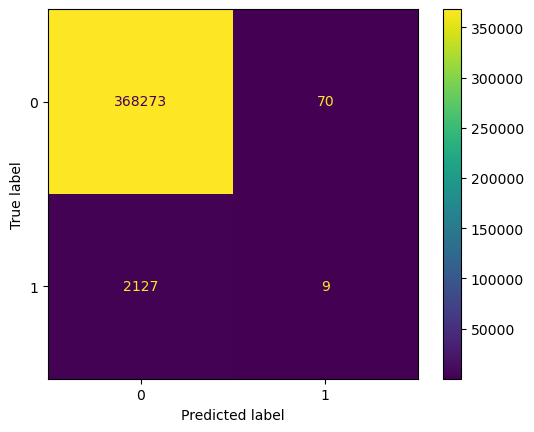

In [33]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, precision_score, recall_score, balanced_accuracy_score

cm = confusion_matrix(y_test, y_pred_logreg)
ConfusionMatrixDisplay(confusion_matrix=cm).plot()

In [35]:
balanced_accuracy_logreg = balanced_accuracy_score(y_test, y_pred_logreg)
precision = precision_score(y_test, y_pred_logreg)
recall = recall_score(y_test, y_pred_logreg)
print('Balanced accuracy of model: {}'.format(balanced_accuracy_logreg))
print('Precesion: {}'  .format(precision))
print('Recall: {}'.format(recall))

Balanced accuracy of model: 0.5020117214423403
Precesion: 0.11392405063291139
Recall: 0.004213483146067416


In [36]:
y_pred_train_logreg = logreg.predict(X_train)
y_pred_test_logreg = y_pred_logreg

balanced_accuracy_train_logreg = balanced_accuracy_score(y_train, y_pred_train_logreg)
balanced_accuracy_test_logreg = balanced_accuracy_score(y_test, y_pred_test_logreg)

print('Balanced accuracy of train set: {}'.format(balanced_accuracy_train_logreg))
print('Balanced accuracy of test set: {}'.format(balanced_accuracy_test_logreg))

Balanced accuracy of train set: 0.5029814164278449
Balanced accuracy of test set: 0.5020117214423403


In [ ]:
- The balanced accuracy of train set and test set are both low (~50%) => This model is being underfitting.
Besides, the precesion and recall metrics are also low => We should not use this model

In [37]:
'''DECISION TREE'''

from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)

y_pred_clf = clf.predict(X_test)

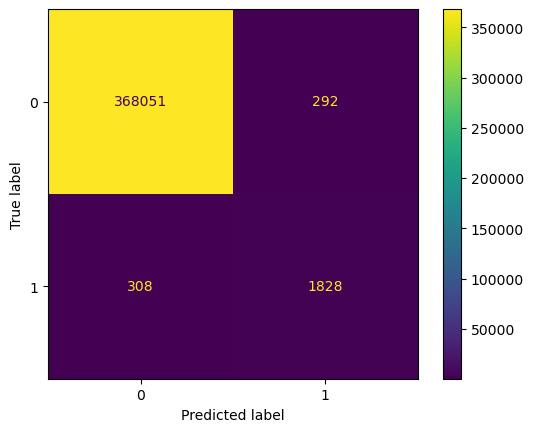

In [38]:
cm = confusion_matrix(y_test, y_pred_clf)
ConfusionMatrixDisplay(confusion_matrix=cm).plot()

In [40]:
balanced_accuracy_clf = balanced_accuracy_score(y_test, y_pred_clf)
precision = precision_score(y_test, y_pred_clf)
recall = recall_score(y_test, y_pred_clf)
print('Balanced accuracy of model: {}'.format(balanced_accuracy_clf))
print('Precesion: {}'  .format(precision))
print('Recall: {}'.format(recall))

Balanced accuracy of model: 0.9275062520348111
Precesion: 0.8622641509433963
Recall: 0.8558052434456929


In [41]:
y_pred_train_clf = clf.predict(X_train)
y_pred_test_clf = y_pred_clf

balanced_accuracy_train_clf = balanced_accuracy_score(y_train, y_pred_train_clf)
balanced_accuracy_test_clf = balanced_accuracy_score(y_test, y_pred_test_clf)

print('Balanced accuracy of train set: {}'.format(balanced_accuracy_train_clf))
print('Balanced accuracy of test set: {}'.format(balanced_accuracy_test_clf))

Balanced accuracy of train set: 1.0
Balanced accuracy of test set: 0.9275062520348111


In [42]:
'''RANDOM FOREST'''

from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)

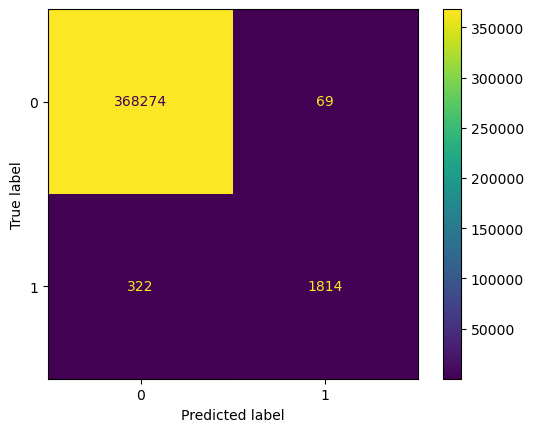

In [43]:
cm = confusion_matrix(y_test, y_pred_rf)
ConfusionMatrixDisplay(confusion_matrix=cm).plot()

In [45]:
balanced_accuracy_rf = balanced_accuracy_score(y_test, y_pred_rf)
precision = precision_score(y_test, y_pred_rf)
recall = recall_score(y_test, y_pred_rf)
print('Balanced accuracy of model: {}'.format(balanced_accuracy_rf))
print('Precesion: {}'  .format(precision))
print('Recall: {}'.format(recall))

Balanced accuracy of model: 0.9245318054645391
Precesion: 0.9633563462559745
Recall: 0.849250936329588


In [47]:
y_pred_train_rf = rf.predict(X_train)
y_pred_test_rf = y_pred_rf

balanced_accuracy_train_rf = balanced_accuracy_score(y_train, y_pred_train_rf)
balanced_accuracy_test_rf = balanced_accuracy_score(y_test, y_pred_test_rf)

print('Balanced accuracy of train set: {}'.format(balanced_accuracy_train_rf))
print('Balanced accuracy of test set: {}'.format(balanced_accuracy_test_rf))

Balanced accuracy of train set: 0.9998838694692835
Balanced accuracy of test set: 0.9245318054645391


### CONCLUSION:
    - LogisticRegression: 50%
    - DecisionTree: 92.8%
    - RandomTree: 92.8%
        
=> We can choose DecisionTree or RandomTree but DecisionTree is slightly better because of higher precesion (96% compared to 86%)